# Intro to markdown (Task 1)

This text is not bold. **But this text is!**

>You miss 100% of the shots you dont take - Wayne Gretzky

# -Conner Gauthier

# My Top 3 Favoite Current F1 Drivers
![F1 Car](https://digitalsport.co/wp-content/uploads/2020/07/2020-07-19T141855Z_917227748_RC2EWH97M68A_RTRMADP_3_MOTOR-F1-HUNGARY.jpg)
1. Geroge Russel
2. Sebastion Vettel
3. Daniel Ricciardo

---

# Task 2

**Done in Lab 4**

---

# Task 3 (method chaining)

In [1]:
## Below done mostly by DIMA

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Method to merge all .csv files into one, so we can enter all data
def merge_data():
  data = [files for files in os.listdir(os.path.join('..','..', '..', 'data','raw')) if files.endswith('.csv')]
  dataFrames = []

  for i in range(len(data)):
    dataFrames.append(pd.read_csv(r"{0}/{1}".format(os.path.join('..','..', '..', 'data','raw'), data[i]), low_memory=False))

  result = pd.concat(dataFrames, ignore_index=True)
  return load_and_process(result)

# Method Chaining
def load_and_process(result):
  # Method Chain 1 (Load data and deal with missing data)
  df1 = (
    result
      .dropna(subset=['Junction_Control'], how='all')
      .reset_index(drop=True)
  )
  # Method Chain 2 (Create new columns, drop others, and do processing)
  df2 = (
    df1.drop(['Accident_Index', 'Urban_or_Rural_Area', 'Location_Easting_OSGR', 'Location_Northing_OSGR', 
              'LSOA_of_Accident_Location', 
                 '2nd_Road_Class', '2nd_Road_Number', 'Junction_Detail', 
              'Local_Authority_(District)', 'Local_Authority_(Highway)'], axis=1)
        .reset_index(drop=True)
        .rename(columns={"Weather_Conditions": "Weather_Type", "Did_Police_Officer_Attend_Scene_of_Accident": "Police_Presense"})
        .replace({'Police_Presense': {'Yes': True, 'No': False}})
        .convert_dtypes()
        .sort_values("Year", ascending=True)
  )
  df2['Date'] = pd.to_datetime(df2['Date'], format='%d/%m/%Y')
  return df2

def year_analysis(df):
  df1 = (
        df.groupby(['Year', 'Number_of_Casualties']).size()
        .to_frame(name = 'Count').reset_index()
  )
  return df1

df = merge_data()

df.head()

,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,Date,Day_of_Week,Time,1st_Road_Class,...,Junction_Control,Pedestrian_Crossing-Human_Control,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Type,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Police_Presense,Year
0,-0.211708,51.520075,1,3,1,1,2005-01-05,4,17:36,4,...,Automatic traffic signal,None within 50 metres,Pedestrian phase at traffic signal junction,Darkness: Street lights present and lit,Fine without high winds,Dry,None,None,True,2005
77615,-0.025826,51.708278,41,3,2,1,2005-02-26,7,08:13,6,...,Stop Sign,None within 50 metres,No physical crossing within 50 meters,Daylight: Street light present,Fine without high winds,Dry,None,None,True,2005
77614,-0.031921,51.707931,41,2,1,1,2005-02-11,6,19:06,6,...,Giveway or uncontrolled,None within 50 metres,No physical crossing within 50 meters,Darkness: Street lights present and lit,Fine without high winds,Wet/Damp,None,None,True,2005
77613,-0.04478,51.691689,41,3,2,1,2005-02-17,5,09:20,3,...,Giveway or uncontrolled,None within 50 metres,No physical crossing within 50 meters,Daylight: Street light present,Other,Dry,None,None,False,2005
77612,-0.056208,51.701861,41,3,1,1,2005-02-01,3,17:12,6,...,Giveway or uncontrolled,None within 50 metres,No physical crossing within 50 meters,Daylight: Street light present,Fine without high winds,Dry,None,None,True,2005


---

## Task 4

In [159]:
import pandas_profiling as pdp
sns.set_theme(font_scale=1)

In [122]:
df.profile_report() ## generate a profile report first to examine data

# Observations
- 77.4 % of accidents had only one casualty. 15.9% had two casualties. 4.3% had three casualties. 4 -> 1.5%, 5-> 0.5% 
- 22.5 % of accidents invloved a single car, 69.1% invloved 2 cars, and 7% of accidents involved 3 cars
- 0.1 % of accidents record "Involvment with previous accident" (570 total reports) 
- Can we graph lattatude/longitude?

Some Roadtype defentions:
1. A roads are major roads. B and C are minor roads either urban or rural which are maintained by a local authority
2. Cariageway is a highway
3. Slipway is a junction allowing a driver to change roads

[Text(0, 0.5, 'Number of Acidents (2005-2014)'),
 Text(0.5, 1.0, 'Accidents by Day of Week and Severity (1 is highest)')]

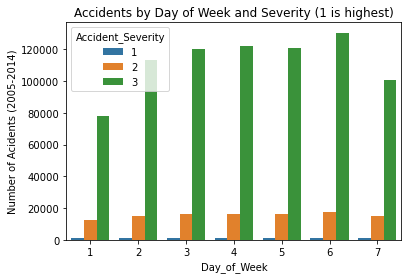

In [93]:
x = sns.countplot(x='Day_of_Week', data=df, hue='Accident_Severity')
x.set(ylabel='Number of Acidents (2005-2014)',title='Accidents by Day of Week and Severity (1 is highest)',)


Is saturday the most dangerous day to drive your car in the UK?

In [40]:
print('There was',df.sum()['Number_of_Casualties'],'casualties between 2005 and 2014 in The UK')

There was 1199780.0 casualties between 2005 and 2014 in The UK


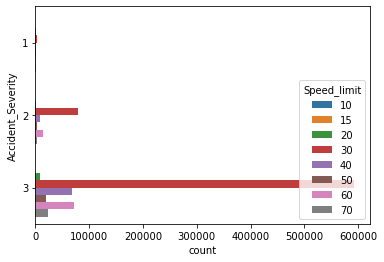

In [69]:
acident=sns.countplot(y='Accident_Severity', hue='Speed_limit',data=df)

No brilliant correlation between speed limit an accident severity. I would bet it is just due to most accidents being low severity (level 3)

In [170]:
dfp = df.dropna() ## the Police_Presense has NA values

sns.countplot(x='Accident_Severity',hue='Police_Presense',data=dfp, )



<AxesSubplot:xlabel='Accident_Severity', ylabel='count'>

**Assosciation Between Severity and Police Presence?**

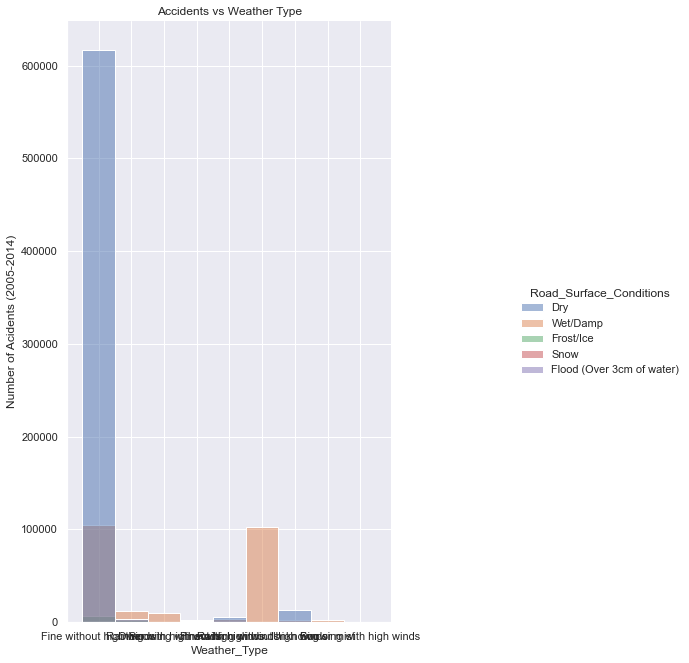

In [171]:
wvs=sns.displot(dfp,x='Weather_Type', hue ='Road_Surface_Conditions')
wvs.fig.set_size_inches(10,10)

wvs.set(ylabel='Number of Acidents (2005-2014)',title='Accidents vs Weather Type')


## This might be interesting in some form. Devil of a time trying to rezie the text on bottom to both fit and remain a reable size.

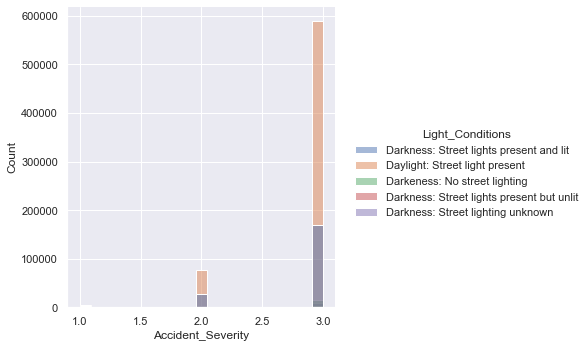

In [173]:
sns.displot(data=df,x='Accident_Severity',hue ='Light_Conditions' )

# I am going to attempt some geographic visualization

In [4]:
import descartes
from shapely.geometry import Point, Polygon

In [5]:
import geopandas as gpd

here is the file https://data.gov.uk/dataset/3fd8d2d2-b591-42ff-b333-c53a6a513e96/countries-december-2017-full-clipped-boundaries-in-great-britain (from Uk office os stats, open data)  and here is a guide I was working off (https://towardsdatascience.com/geopandas-101-plot-any-data-with-a-latitude-and-longitude-on-a-map-98e01944b972).**

# 

In [8]:
GB=gpd.read_file(r"C:\Users\conne\Desktop\gp\course-project-group_1007\Shape\Countries_(December_2017)_Boundaries.shp")

Text(0.5, 114.0, 'Longitude')

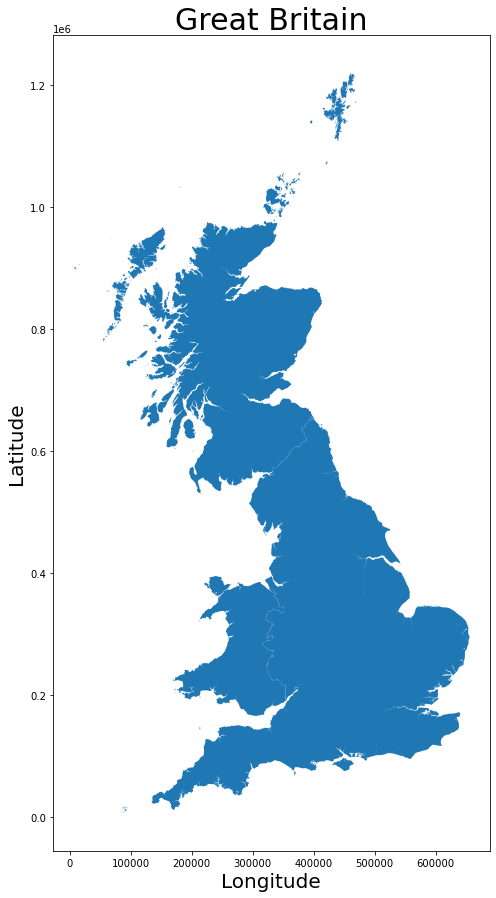

In [26]:
fig, ax = plt.subplots(figsize = (15,15))
GB.plot(ax=ax)
ax.set_title('Great Britain',fontdict = {'fontsize': 30})
ax.set_ylabel('Latitude',fontdict = {'fontsize': 20})
ax.set_xlabel('Longitude',fontdict = {'fontsize': 20})


In [21]:
df2=df.dropna(subset=['Longitude','Latitude'], how='all')

In [23]:
geo= [Point(xy) for xy in zip( df2['Longitude'], df2['Latitude'])]

In [38]:
geo_df = gpd.GeoDataFrame(geometry= geo)
geo_df.head()

,geometry
0,POINT (-0.21171 51.52007)
1,POINT (-0.02583 51.70828)
2,POINT (-0.03192 51.70793)
3,POINT (-0.04478 51.69169)
4,POINT (-0.05621 51.70186)


Text(0.5, 114.0, 'Longitude')

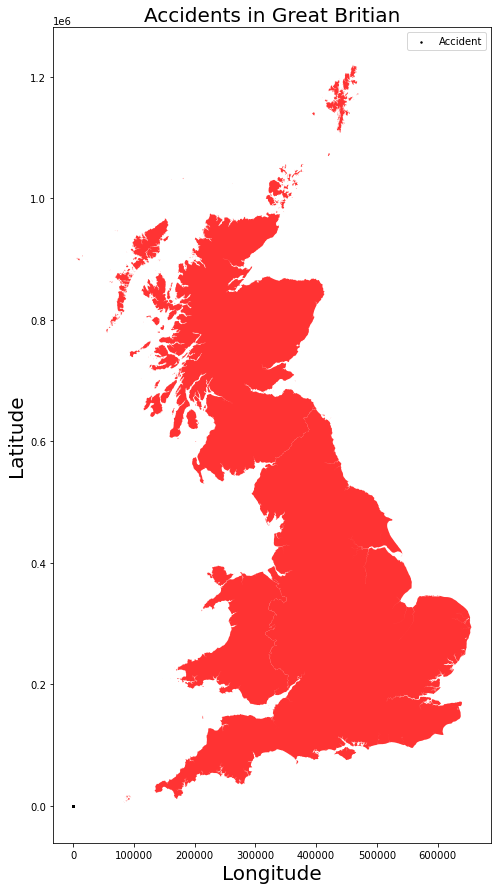

In [39]:
fig, ax = plt.subplots(figsize = (15,15))
GB.plot(ax=ax, alpha = 0.8, color = 'Red')
geo_df.plot(ax = ax , markersize = 2, color = 'black',marker =
            'o',label = 'Accident', aspect = 1)
plt.legend(prop = {'size':10} )
ax.set_title('Accidents in Great Britian', fontdict = {'fontsize':
                20})
ax.set_ylabel('Latitude',fontdict = {'fontsize': 20})
ax.set_xlabel('Longitude',fontdict = {'fontsize': 20})

Text(0.5, 114.0, 'Longitude')

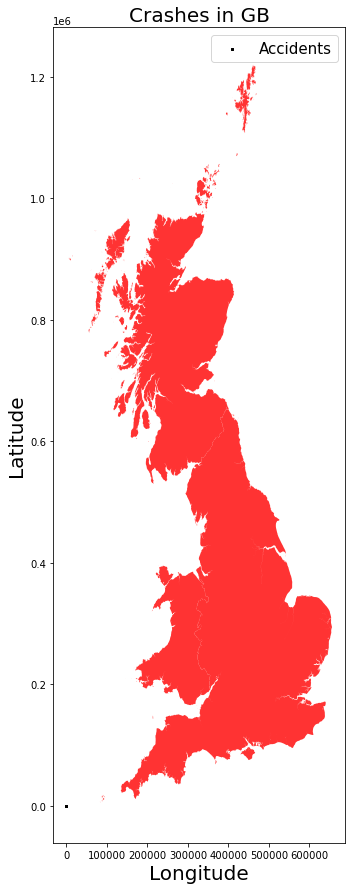

In [42]:
fig, ax = plt.subplots(figsize = (15,15))
GB.plot(ax=ax, alpha = 0.8, color = 'red')
geo_df['geometry'].plot(ax = ax , markersize = 2,
                color = 'black',marker = 's',label = 'Accidents',
                aspect = 1.5)
plt.legend(prop = {'size':15} )
ax.set_title('Crashes in GB', fontdict =
              {'fontsize': 20})
ax.set_ylabel('Latitude',fontdict = {'fontsize': 20})
ax.set_xlabel('Longitude',fontdict = {'fontsize': 20})